In [1]:
import os
import pathlib
import pandas as pd
import mne
import mne_bids
import numpy as np
from mne_bids import BIDSPath, read_raw_bids
from matplotlib import pyplot as plt
from autoreject import AutoReject

In [2]:
subjectid = '013' #TODO 7 and 8
task = 'N170'
suffix = 'eeg'
session = task
datatype = suffix
root = "bids/n170"
stimuluskey = 'stimulus'
responsekey = 'response'

In [3]:
eventid = {'faces': {i for i in range(1, 41)},
           'cars': {i for i in range(41, 80)},
           'faces_scrambled': {i for i in range(101, 141)},
           'cars_scrambled': {i for i in range(141, 181)}}

# Data reading


In [4]:
bids_path = BIDSPath(subject=subjectid, task=task, session=session,
                         datatype=datatype, suffix=suffix,
                         root=root)

# read the file
raw = read_raw_bids(bids_path)
raw.set_channel_types({'HEOG_left':'eog', 'HEOG_right':'eog', 'VEOG_lower':'eog'})
raw.set_montage('standard_1020', match_case=False)
raw.load_data()

Reading /home/jinaz/Desktop/EEG-semproject/bids/n170/sub-013/ses-N170/eeg/sub-013_ses-N170_task-N170_eeg.fdt
Reading events from bids/n170/sub-013/ses-N170/eeg/sub-013_ses-N170_task-N170_events.tsv.
The event "response" refers to multiple event values. Creating hierarchical event names.
    Renaming event: response -> response/202
    Renaming event: response -> response/202
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/202
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/202
    Renaming event: response -> response/201
    Renaming event: response -> respo

<ipython-input-4-b0967ecaf489>:6: RuntimeWarning: Data file name in EEG.data (sub-013_task-N170_eeg.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-013_ses-N170_task-N170_eeg.fdt).
  raw = read_raw_bids(bids_path)


    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/202
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renaming event: response -> response/201
    Renami

<ipython-input-4-b0967ecaf489>:6: RuntimeWarning: Participants file not found for sub-013_ses-N170_task-N170_eeg.set... Not reading in any particpants.tsv data.
  raw = read_raw_bids(bids_path)


<RawEEGLAB | sub-013_ses-N170_task-N170_eeg.fdt, 33 x 601088 (587.0 s), ~151.4 MB, data loaded>

# Filtering

defined the highpass and the lowpass for filtering the data. Afterwards plot the results to view if it looks right in comparison to our exerciese 2 and the mne documentation with examples.

In [5]:
highpass = 0.5
lowpass = 80

Effective window size : 2.000 (s)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 80 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 80.00 Hz
- Upper transition bandwidth: 20.00 Hz (-6 dB cutoff frequency: 90.00 Hz)
- Filter length: 6759 samples (6.601 sec)

Effective window size : 2.000 (s)


/home/jinaz/.local/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


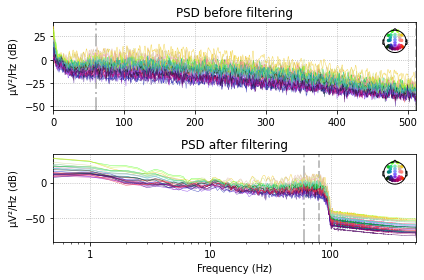

In [6]:

fig, ax = plt.subplots(2)

raw.plot_psd(ax=ax[0], area_mode='range', tmax=10.0, average=False, xscale="linear", show=False)
raw_f = raw.copy().filter(highpass, lowpass, fir_design='firwin')
raw_f.plot_psd(ax=ax[1], area_mode='range', tmax=10.0, average=False, xscale="log", show=False)

ax[0].set_title('PSD before filtering')
ax[1].set_title('PSD after filtering')
ax[1].set_xlabel('Frequency (Hz)')
fig.set_tight_layout(True)
plt.show()
plt.savefig('img/sub-{}/psd.png'.format(subjectid))

# Re-referencing

in general there is no need to re-reference a channel in this subject. I tried to set an average reference.

In [7]:
rc = raw_f.copy()

rc.set_eeg_reference('average', projection=False)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom EEG reference.


<RawEEGLAB | sub-013_ses-N170_task-N170_eeg.fdt, 33 x 601088 (587.0 s), ~151.4 MB, data loaded>

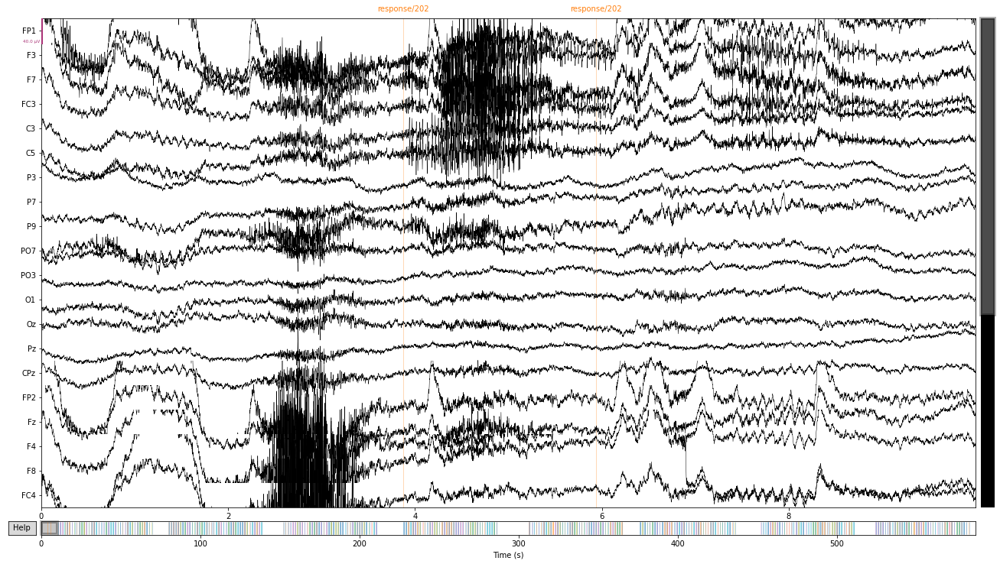

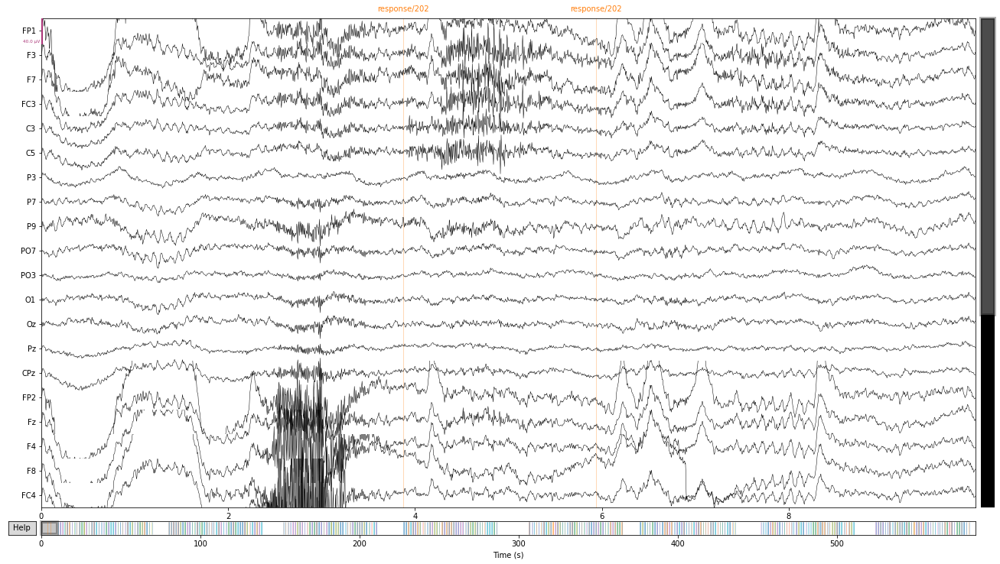

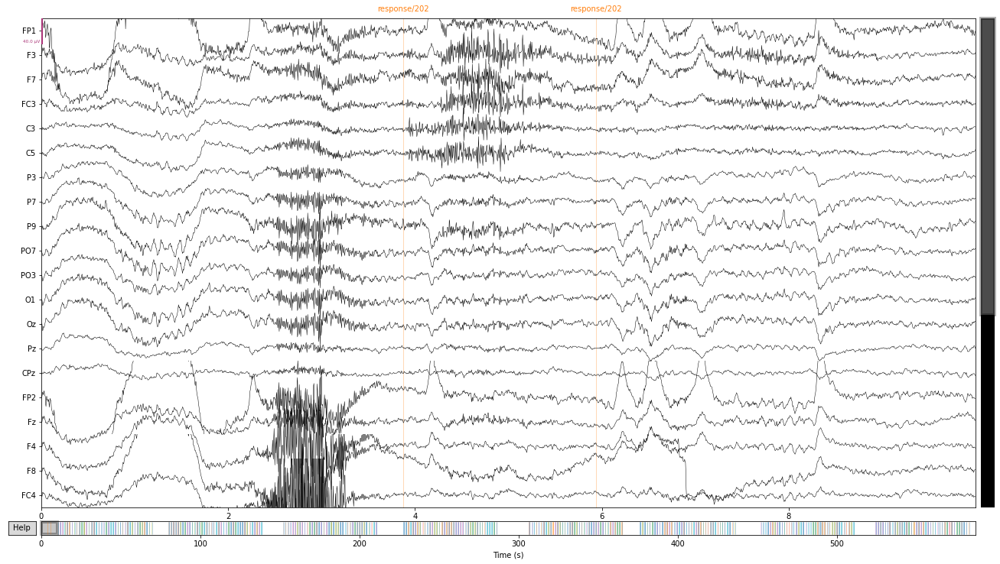

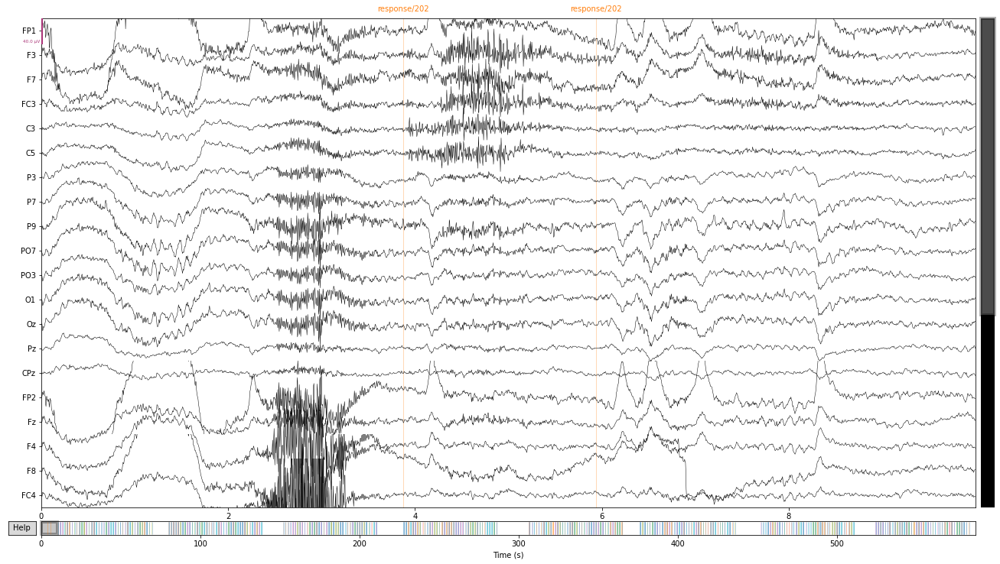

In [8]:
raw.plot()
raw_f.plot()
rc.plot()

In [9]:
evts, evtsdict = mne.events_from_annotations(rc)
raw_epochs = mne.Epochs(raw, evts, evtsdict, tmin=-0.2, tmax=1)
filtered_epochs = mne.Epochs(raw_f, evts, evtsdict, tmin=-0.2, tmax=1)
rc_epochs = mne.Epochs(rc, evts, evtsdict, tmin=-0.2, tmax=1)

Used Annotations descriptions: ['response/201', 'response/202', 'stimulus/1', 'stimulus/10', 'stimulus/101', 'stimulus/102', 'stimulus/103', 'stimulus/104', 'stimulus/105', 'stimulus/106', 'stimulus/107', 'stimulus/108', 'stimulus/109', 'stimulus/11', 'stimulus/110', 'stimulus/111', 'stimulus/112', 'stimulus/113', 'stimulus/114', 'stimulus/115', 'stimulus/116', 'stimulus/117', 'stimulus/118', 'stimulus/119', 'stimulus/12', 'stimulus/120', 'stimulus/121', 'stimulus/122', 'stimulus/123', 'stimulus/124', 'stimulus/125', 'stimulus/126', 'stimulus/127', 'stimulus/128', 'stimulus/129', 'stimulus/13', 'stimulus/130', 'stimulus/131', 'stimulus/132', 'stimulus/133', 'stimulus/134', 'stimulus/135', 'stimulus/136', 'stimulus/137', 'stimulus/138', 'stimulus/139', 'stimulus/14', 'stimulus/140', 'stimulus/141', 'stimulus/142', 'stimulus/143', 'stimulus/144', 'stimulus/145', 'stimulus/146', 'stimulus/147', 'stimulus/148', 'stimulus/149', 'stimulus/15', 'stimulus/150', 'stimulus/151', 'stimulus/152', 

# ICA

repairing the artifacts of eyeblinks and muscle noise with ica. I compared the possibe methods for ica and chose to use fastica. Here I will provide a short explanation. The full explanation is in the pdf.   

FastICA ist more robust than picard and faster and less memory consuming than infomax. 

Fitting ICA to data using 30 channels (please be patient, this may take a while)


<ipython-input-10-5774213e496b>:1: DeprecationWarning: Version 0.23 introduced max_iter="auto", setting max_iter=1000 for `fastica` and max_iter=500 for `infomax` and `picard`. The current default of max_iter=200 will be changed to "auto" in version 0.24.
  ica = mne.preprocessing.ICA(method="fastica")


Selecting by non-zero PCA components: 29 components
Fitting ICA took 46.1s.


[<MNEFigure size 702x696.24 with 20 Axes>,
 <MNEFigure size 702x357.12 with 9 Axes>]

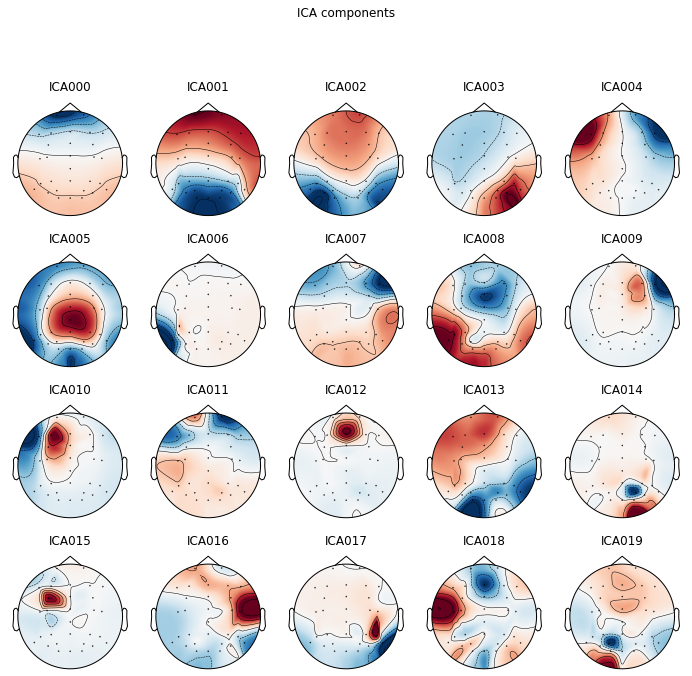

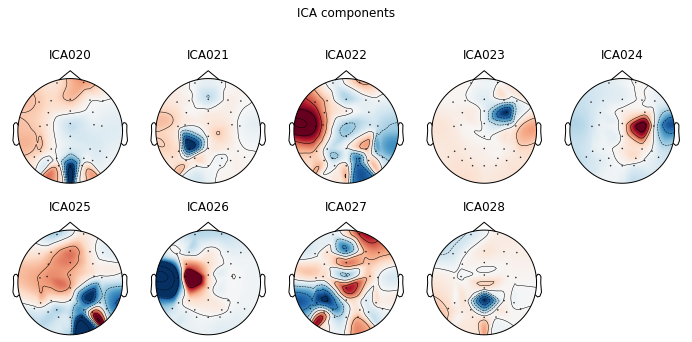

In [10]:
ica = mne.preprocessing.ICA(method="fastica")
ica.fit(rc, verbose=True)
ica.plot_components(show=False)

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied


/home/jinaz/.local/lib/python3.8/site-packages/mne/viz/ica.py:110: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
293 matching events found
No baseline correction applied


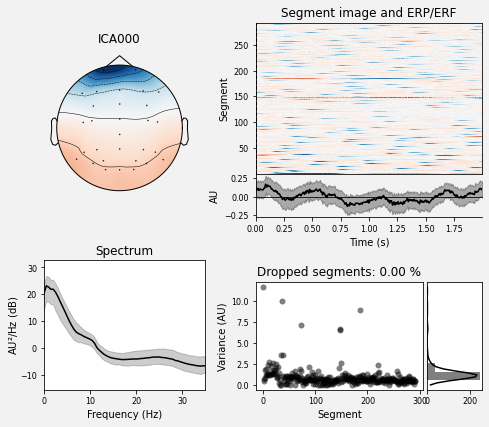

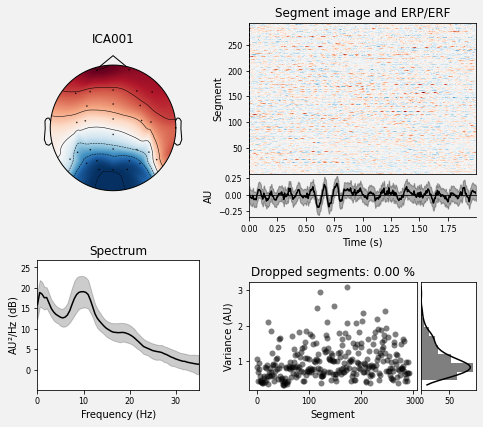

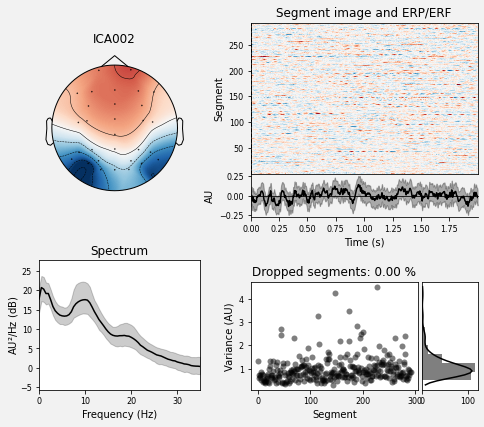

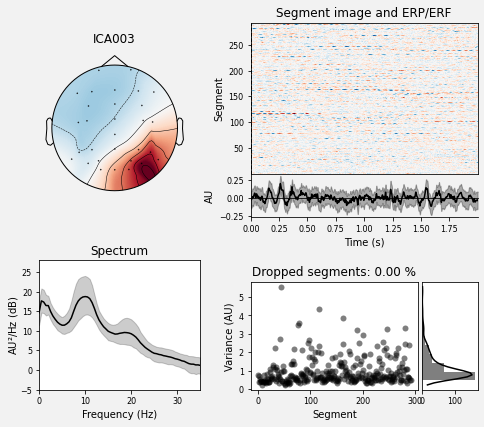

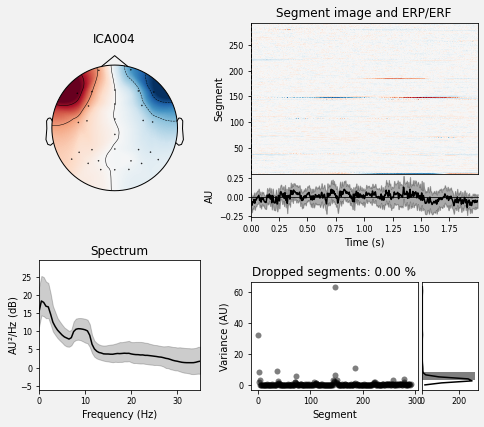

...

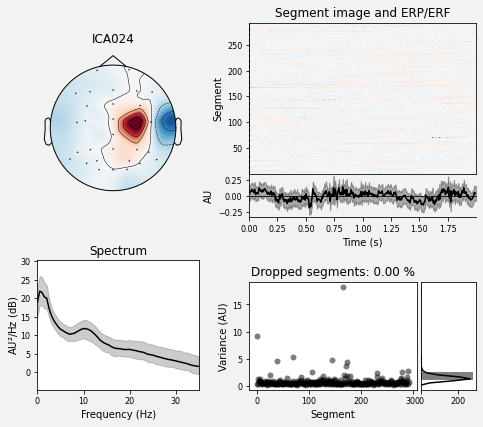

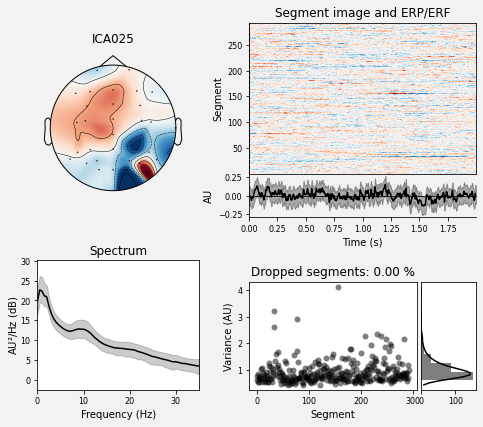

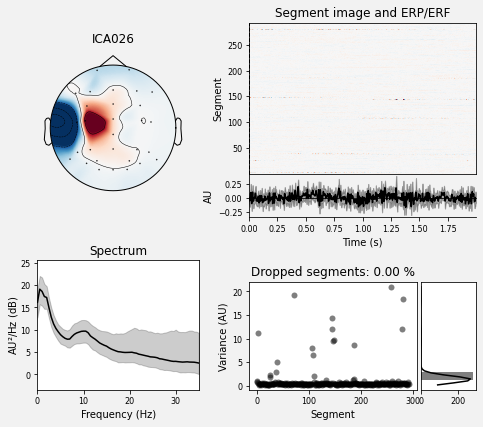

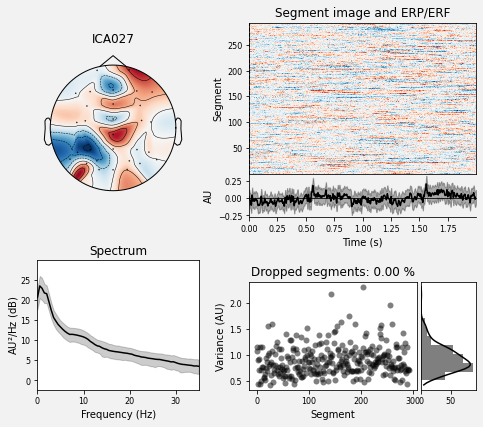

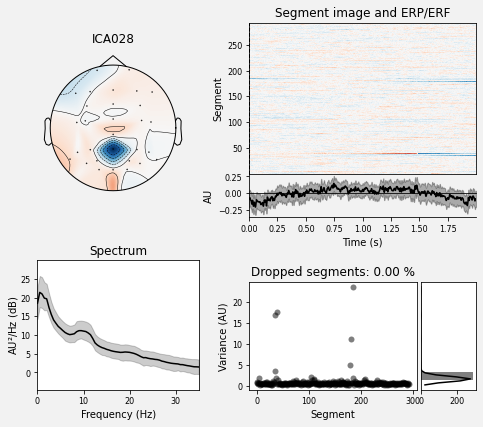

In [11]:
for i in range(29):
    ica.plot_properties(rc, picks=[i], psd_args={'fmax': 35.}, reject=None, show=False)
    plt.savefig("img/sub-{}/sub-{}-ica-{}.png".format(subjectid,subjectid, i))

Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 1 ICA component
    Projecting back using 30 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 1 ICA component
    Projecting back using 30 PCA components


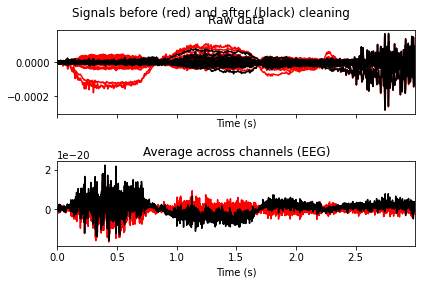

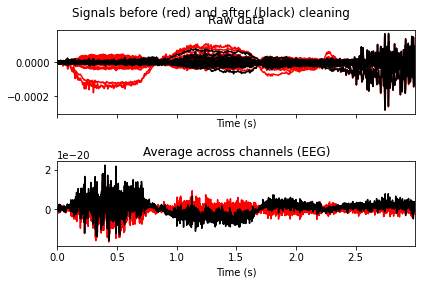

In [12]:
components_excluded = [0]#[0,1,4,7,10,12,14,26,28]#3,4,13,16,18,19,20,21,25,26,27,29]
#[0,2,3,4,5,9,10,12,23,24]#[0,1,2,7,8,10,11,14,15,19,20,21,23,25,26,27,28,29]#[0,1,4,9,12,20]#[0,1,2,7,8,10,11,14,15,19,20,21,23,25,26,27,28,29]

reconstraw = rc.copy()
ica.apply(reconstraw, exclude=components_excluded)
ica.plot_overlay(rc,exclude=components_excluded,show=False)
#plt.savefig("img/sub-{}_overlay.png".format(subjectid))

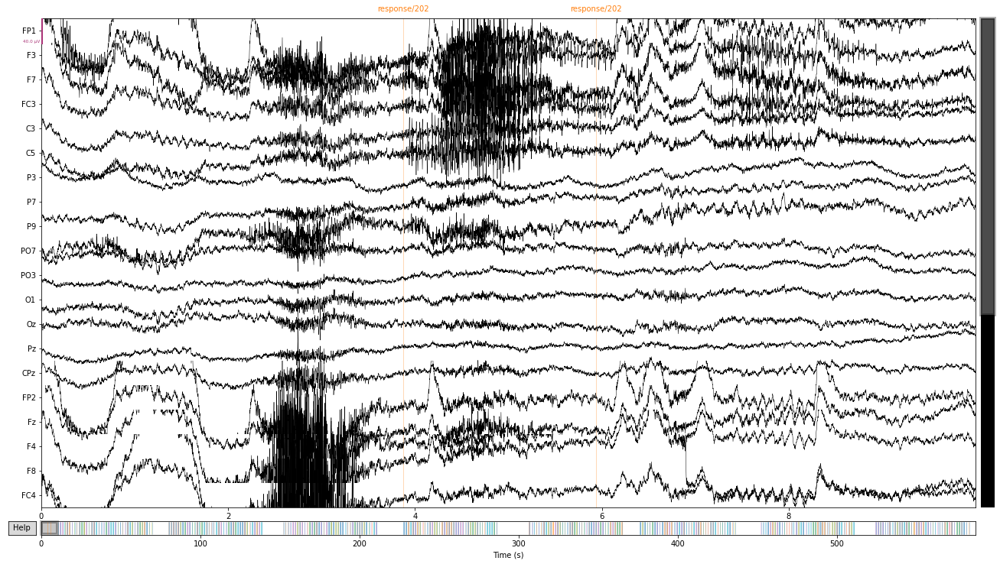

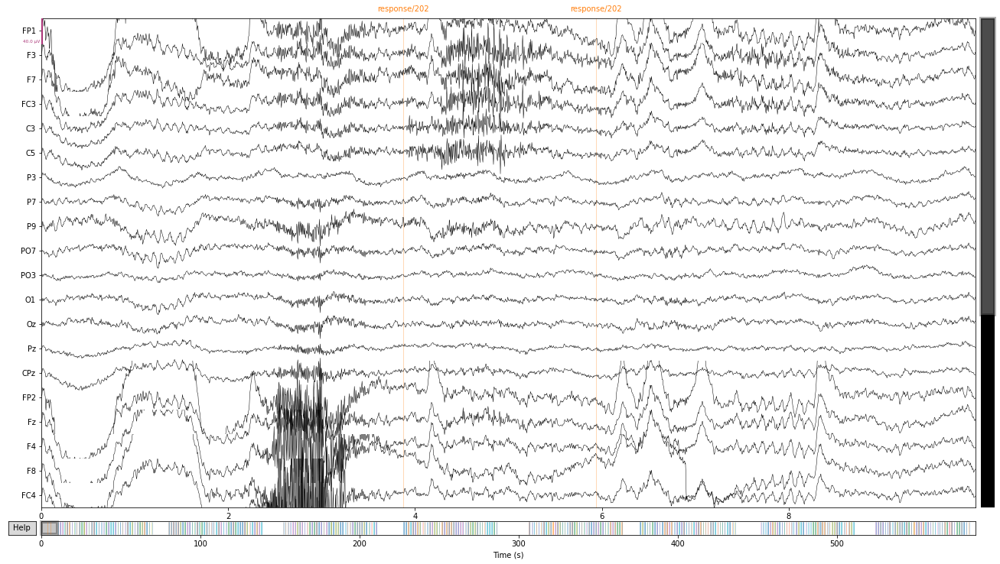

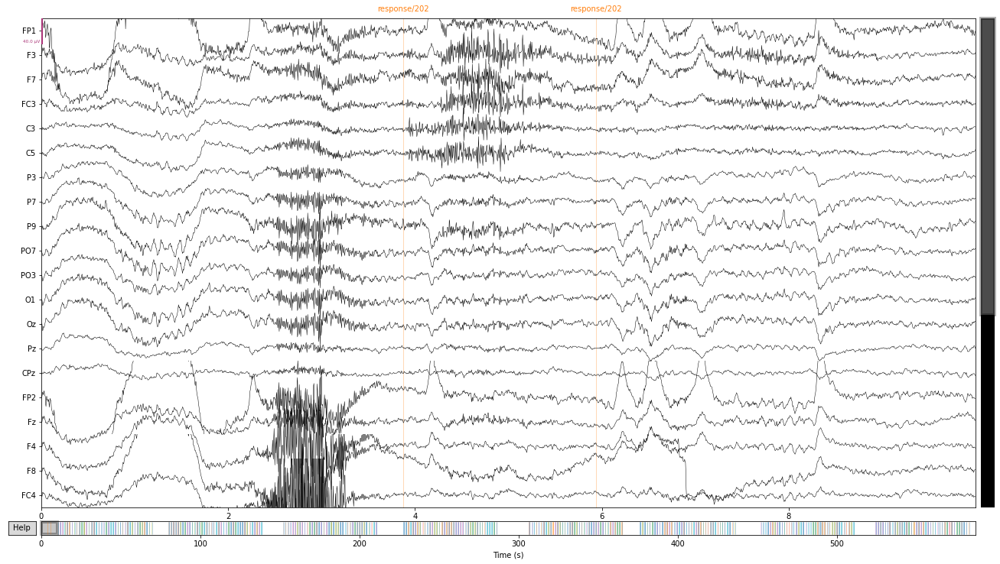

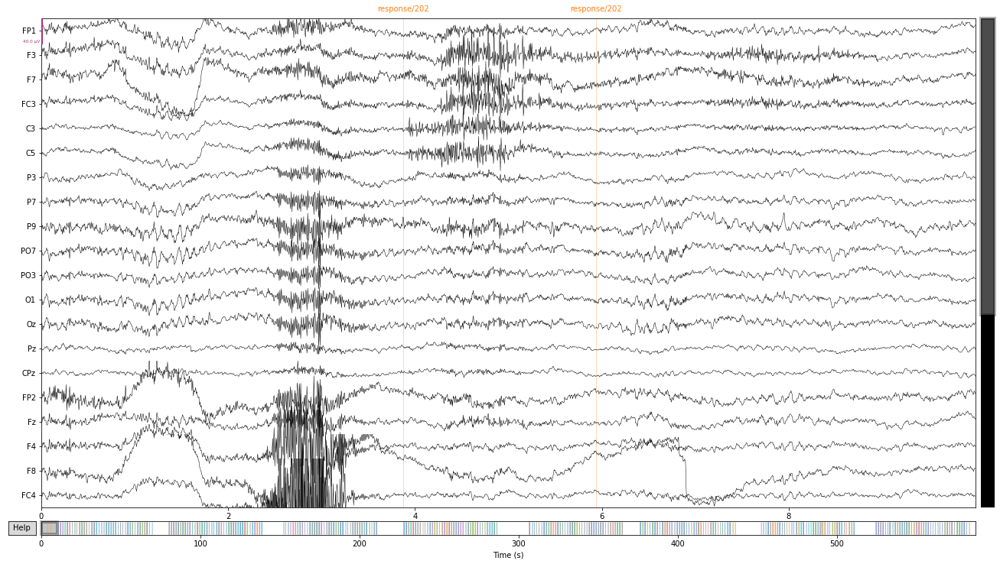

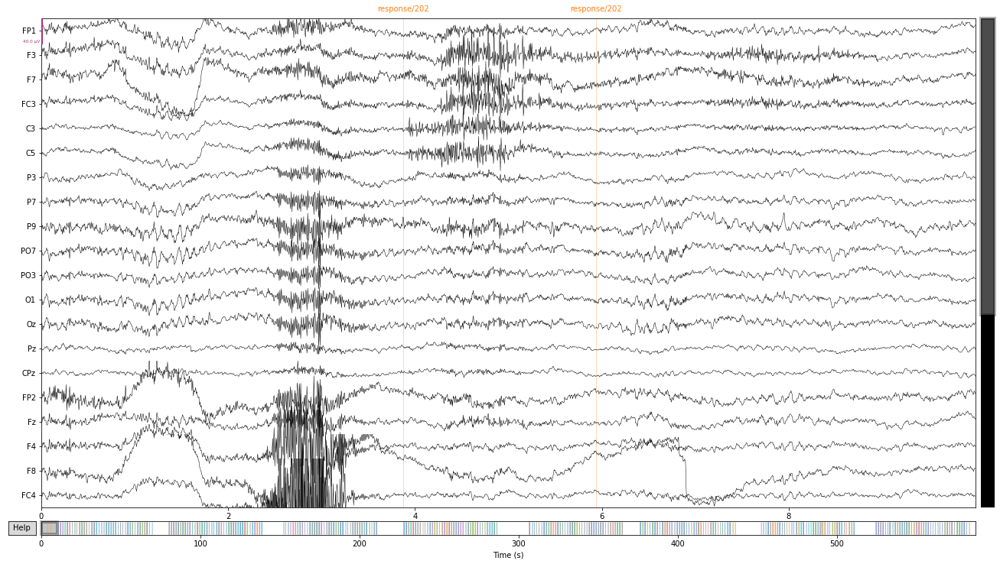

In [13]:
raw.plot()
raw_f.plot()
rc.plot()
reconstraw.plot()

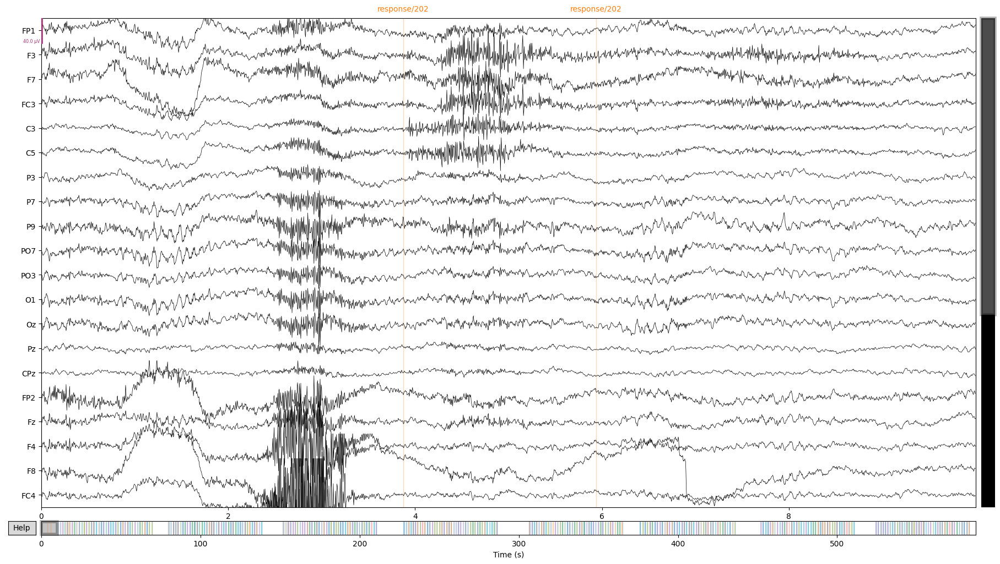

In [14]:
%matplotlib qt
reconstraw.plot()

In [15]:
%matplotlib inline 

Channels marked as bad: none


# Data cleaning


define a method to save the bad segments to a csv according to our needs. Compare whether an epoch is missing(dropped) and get its time and duration and save it to CSV. This can be read with code later on. 

In [16]:
def saveToCSV(epochs, raw, kind, subjectid):
    annos = mne.annotations_from_events(epochs.events, sfreq=raw.info['sfreq'])
    annotlist = []
    annos_raw = raw.annotations    
    evts, evtsdict = mne.events_from_annotations(raw)
    for anno in annos_raw:
        anno['description'] = str(evtsdict.get(anno['description']))
        match = False
        for ann in annos:
            if not match:
                if anno['description'] == ann['description']:
                    match = True
        if not match:
            annotlist.append(anno)
    #print(annotlist)

    d = {'onset': [], 'duration': [], 'description': []}
    for anno in annotlist:
        d['onset'].append(anno['onset'])
        d['duration'].append(anno['duration'])
        d['description'].append('BAD_{}'.format(kind))
    df = pd.DataFrame(data=d)
    df.to_csv("out_data/sub-{}_{}_bads.csv".format(subjectid, kind), index=False)
    print("saving of {} done".format(kind))
    return annotlist

For reproducability I used a rejection criteria. Rejecting by eye would result in inconsistency and impossible reproduction of the results.

In [17]:
evts_raw, evts_dict = mne.events_from_annotations(reconstraw)
epochs = mne.Epochs(reconstraw, evts_raw, evts_dict, tmin=-0.2, tmax=1)

Used Annotations descriptions: ['response/201', 'response/202', 'stimulus/1', 'stimulus/10', 'stimulus/101', 'stimulus/102', 'stimulus/103', 'stimulus/104', 'stimulus/105', 'stimulus/106', 'stimulus/107', 'stimulus/108', 'stimulus/109', 'stimulus/11', 'stimulus/110', 'stimulus/111', 'stimulus/112', 'stimulus/113', 'stimulus/114', 'stimulus/115', 'stimulus/116', 'stimulus/117', 'stimulus/118', 'stimulus/119', 'stimulus/12', 'stimulus/120', 'stimulus/121', 'stimulus/122', 'stimulus/123', 'stimulus/124', 'stimulus/125', 'stimulus/126', 'stimulus/127', 'stimulus/128', 'stimulus/129', 'stimulus/13', 'stimulus/130', 'stimulus/131', 'stimulus/132', 'stimulus/133', 'stimulus/134', 'stimulus/135', 'stimulus/136', 'stimulus/137', 'stimulus/138', 'stimulus/139', 'stimulus/14', 'stimulus/140', 'stimulus/141', 'stimulus/142', 'stimulus/143', 'stimulus/144', 'stimulus/145', 'stimulus/146', 'stimulus/147', 'stimulus/148', 'stimulus/149', 'stimulus/15', 'stimulus/150', 'stimulus/151', 'stimulus/152', 

Loading data for 642 events and 1230 original time points ...
0 bad epochs dropped
Loading data for 307 events and 1230 original time points ...
Loading data for 20 events and 1230 original time points ...


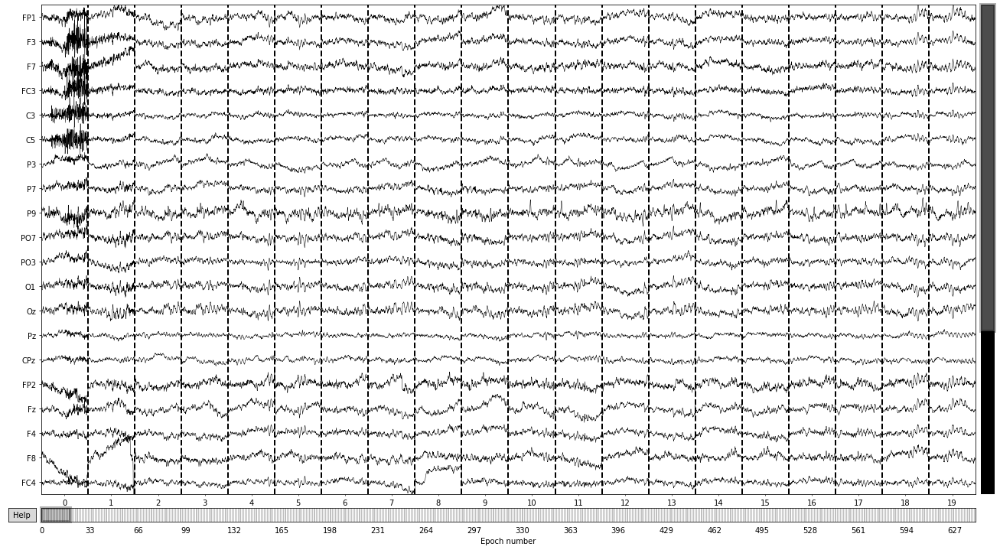

In [18]:
epochs.plot()
rej_epochs = epochs.copy()

In [19]:
reject_criteria = dict(eeg=200e-6,
                           eog=200e-6)
flat_criteria = dict(eeg=1e-6)

Plotting the drop log to see how many epochs have been dropped. If there are too many eg. 80+% dropped there was a need to tune down the criteria as they would be too strict for the dataset. Some datasets seem to be very clean from beginning and tuning up the rates only results in loss of important epochs. Before rejecting and dropping the epochs I did a little viewing of the epoched data to get an overview. Afterwards I viewed the drop log to verify that I did not drop too much data. If there were complications I tuned the criteria again.

Loading data for 642 events and 1230 original time points ...
    Rejecting  epoch based on EOG : ['VEOG_lower']
    Rejecting  epoch based on EOG : ['VEOG_lower']
    Rejecting  epoch based on EEG : ['FC4']
    Rejecting  epoch based on EEG : ['FC4']
    Rejecting  epoch based on EEG : ['F3', 'F7', 'FC3']
    Rejecting  epoch based on EEG : ['F3', 'F7', 'FC3']
    Rejecting  epoch based on EOG : ['VEOG_lower']
7 bad epochs dropped


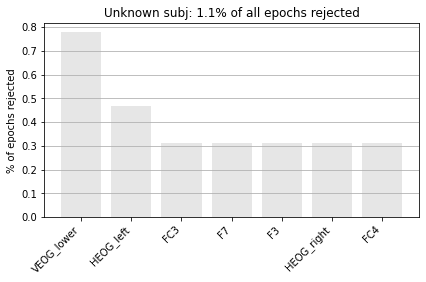

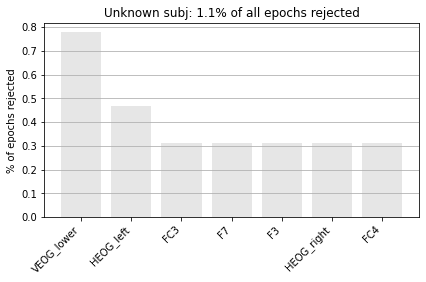

In [20]:
rej_epochs.drop_bad(reject=reject_criteria, flat=flat_criteria)
rej_epochs.plot_drop_log()

In [21]:
annos = saveToCSV(rej_epochs, reconstraw, 'manual', subjectid)

Used Annotations descriptions: ['response/201', 'response/202', 'stimulus/1', 'stimulus/10', 'stimulus/101', 'stimulus/102', 'stimulus/103', 'stimulus/104', 'stimulus/105', 'stimulus/106', 'stimulus/107', 'stimulus/108', 'stimulus/109', 'stimulus/11', 'stimulus/110', 'stimulus/111', 'stimulus/112', 'stimulus/113', 'stimulus/114', 'stimulus/115', 'stimulus/116', 'stimulus/117', 'stimulus/118', 'stimulus/119', 'stimulus/12', 'stimulus/120', 'stimulus/121', 'stimulus/122', 'stimulus/123', 'stimulus/124', 'stimulus/125', 'stimulus/126', 'stimulus/127', 'stimulus/128', 'stimulus/129', 'stimulus/13', 'stimulus/130', 'stimulus/131', 'stimulus/132', 'stimulus/133', 'stimulus/134', 'stimulus/135', 'stimulus/136', 'stimulus/137', 'stimulus/138', 'stimulus/139', 'stimulus/14', 'stimulus/140', 'stimulus/141', 'stimulus/142', 'stimulus/143', 'stimulus/144', 'stimulus/145', 'stimulus/146', 'stimulus/147', 'stimulus/148', 'stimulus/149', 'stimulus/15', 'stimulus/150', 'stimulus/151', 'stimulus/152', 

# Autoreject as sanity check/reference

using autoreject as a reference to the rejection by criteria. As I did know that automatic pipelines are prohibited, I was unsure if I was allowed to use autoreject as it has a full machine learning pipeline to reject epochs. So I would like to offer this as a reference to the rejection via criteria and as an alternative solution as well as a sanity check for comparison. 

In [22]:
evts_raw, evts_dict = mne.events_from_annotations(reconstraw)
epochs = mne.Epochs(reconstraw, evts_raw, evts_dict, tmin=-0.2, tmax=1)

Used Annotations descriptions: ['response/201', 'response/202', 'stimulus/1', 'stimulus/10', 'stimulus/101', 'stimulus/102', 'stimulus/103', 'stimulus/104', 'stimulus/105', 'stimulus/106', 'stimulus/107', 'stimulus/108', 'stimulus/109', 'stimulus/11', 'stimulus/110', 'stimulus/111', 'stimulus/112', 'stimulus/113', 'stimulus/114', 'stimulus/115', 'stimulus/116', 'stimulus/117', 'stimulus/118', 'stimulus/119', 'stimulus/12', 'stimulus/120', 'stimulus/121', 'stimulus/122', 'stimulus/123', 'stimulus/124', 'stimulus/125', 'stimulus/126', 'stimulus/127', 'stimulus/128', 'stimulus/129', 'stimulus/13', 'stimulus/130', 'stimulus/131', 'stimulus/132', 'stimulus/133', 'stimulus/134', 'stimulus/135', 'stimulus/136', 'stimulus/137', 'stimulus/138', 'stimulus/139', 'stimulus/14', 'stimulus/140', 'stimulus/141', 'stimulus/142', 'stimulus/143', 'stimulus/144', 'stimulus/145', 'stimulus/146', 'stimulus/147', 'stimulus/148', 'stimulus/149', 'stimulus/15', 'stimulus/150', 'stimulus/151', 'stimulus/152', 

In [23]:
ar = AutoReject(verbose='tqdm')
ar_epochs = epochs.copy()
ar_epochs.load_data()
ar_epochs = ar.fit_transform(ar_epochs)

Loading data for 642 events and 1230 original time points ...
0 bad epochs dropped
Running autoreject on ch_type=eeg


Computing thresholds ...: 100%|██████████| 30/30 [03:56<00:00,  7.87s/it]














Repairing epochs: 100%|██████████| 642/642 [00:01<00:00, 456.61it/s]
























































































Repairing epochs: 100%|██████████| 642/642 [00:09<00:00, 65.92it/s]






















Fold: 100%|██████████| 10/10 [00:43<00:00,  4.31s/it]










































































Repairing epochs: 100%|██████████| 642/642 [00:08<00:00, 74.67it/s]






















Fold: 100%|██████████| 10/10 [00:35<00:00,  3.50s/it]

























































































Repairing epochs: 100%|██████████| 642/642 [00:10<00:00, 61.28it/s]






















n_interp: 100%|██████████| 3/3 [01:52<00:00, 37.37s/it]






Estimated consensus=0.30 and n_interpolate=4










































































Repairing epochs: 100%|██████████| 642/642 [00:08<00:00, 76.75it/s]


Dropped 174 epochs: 47, 48, 63, 64, 65, 88, 90, 91, 92, 93, 94, 95, 147, 157, 158, 159, 161, 164, 165, 167, 169, 177, 179, 180, 181, 182, 207, 208, 212, 213, 217, 223, 233, 244, 245, 246, 247, 248, 249, 250, 251, 252, 261, 262, 263, 264, 287, 294, 295, 297, 298, 299, 300, 301, 302, 330, 331, 332, 336, 337, 340, 341, 342, 348, 349, 352, 365, 367, 368, 376, 377, 378, 379, 380, 381, 382, 384, 385, 391, 396, 397, 405, 406, 408, 409, 410, 412, 413, 419, 420, 421, 422, 426, 427, 428, 433, 434, 435, 436, 437, 440, 441, 442, 443, 451, 469, 473, 482, 484, 485, 486, 487, 491, 492, 496, 497, 498, 499, 500, 510, 511, 515, 516, 518, 519, 520, 521, 522, 523, 525, 530, 531, 532, 535, 536, 537, 538, 539, 540, 541, 542, 543, 546, 552, 553, 555, 564, 566, 567, 572, 573, 578, 579, 582, 583, 584, 597, 601, 602, 608, 609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 623, 636, 637, 641


In [24]:
r = ar.get_reject_log(ar_epochs)

In [25]:
saveToCSV(ar_epochs, reconstraw, 'autoreject', subjectid)

Used Annotations descriptions: ['response/201', 'response/202', 'stimulus/1', 'stimulus/10', 'stimulus/101', 'stimulus/102', 'stimulus/103', 'stimulus/104', 'stimulus/105', 'stimulus/106', 'stimulus/107', 'stimulus/108', 'stimulus/109', 'stimulus/11', 'stimulus/110', 'stimulus/111', 'stimulus/112', 'stimulus/113', 'stimulus/114', 'stimulus/115', 'stimulus/116', 'stimulus/117', 'stimulus/118', 'stimulus/119', 'stimulus/12', 'stimulus/120', 'stimulus/121', 'stimulus/122', 'stimulus/123', 'stimulus/124', 'stimulus/125', 'stimulus/126', 'stimulus/127', 'stimulus/128', 'stimulus/129', 'stimulus/13', 'stimulus/130', 'stimulus/131', 'stimulus/132', 'stimulus/133', 'stimulus/134', 'stimulus/135', 'stimulus/136', 'stimulus/137', 'stimulus/138', 'stimulus/139', 'stimulus/14', 'stimulus/140', 'stimulus/141', 'stimulus/142', 'stimulus/143', 'stimulus/144', 'stimulus/145', 'stimulus/146', 'stimulus/147', 'stimulus/148', 'stimulus/149', 'stimulus/15', 'stimulus/150', 'stimulus/151', 'stimulus/152', 

[OrderedDict([('onset', 44.8174),
              ('duration', 0.3),
              ('description', '54'),
              ('orig_time', None)]),
 OrderedDict([('onset', 56.9639),
              ('duration', 0.3),
              ('description', '44'),
              ('orig_time', None)]),
 OrderedDict([('onset', 88.6025),
              ('duration', 0.3),
              ('description', '19'),
              ('orig_time', None)]),
 OrderedDict([('onset', 189.166),
              ('duration', 0.3),
              ('description', '10'),
              ('orig_time', None)]),
 OrderedDict([('onset', 266.2725),
              ('duration', 0.3),
              ('description', '70'),
              ('orig_time', None)]),
 OrderedDict([('onset', 312.4385),
              ('duration', 0.3),
              ('description', '103'),
              ('orig_time', None)]),
 OrderedDict([('onset', 319.7031),
              ('duration', 0.3),
              ('description', '70'),
              ('orig_time', None)]),
 OrderedD

# PO8 sanity check

for a sanity check I used the PO8 channel as in literature to compare the results for each step.

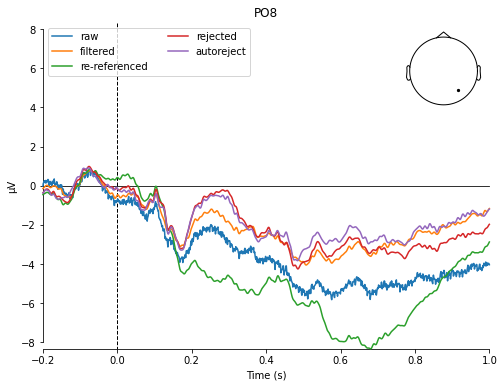

In [26]:
mne.viz.plot_compare_evokeds({
        'raw': raw_epochs.average(),
        'filtered': filtered_epochs.average(),
        're-referenced': rc_epochs.average(),
        'rejected':rej_epochs.average(),
        'autoreject':ar_epochs.average()
        }, picks="PO8", show=False)
plt.savefig("img/sub-{}/sub-{}_epoched_PO8.png".format(subjectid,subjectid))
